# 0. Imports and constants

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import warnings

from ast import literal_eval
from random import sample
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from statistics import mode
from wordcloud import WordCloud

In [2]:
seed = 42
warnings.filterwarnings('ignore')

# 1. Preprocessing
### 1. Read data frames

In [3]:
df_movies = pd.read_csv('movies.csv')
df_keywords = pd.read_csv('keywords.csv')

### 2. Remove missing or malformed data

In [4]:
columns = ['id','genres']
df_movies = df_movies[columns]

In [5]:
df_movies.dropna(inplace=True)
df_movies['as_int'] = df_movies.id.apply(lambda x: x.isnumeric())
df_movies = df_movies[(df_movies.genres != '[]') & (df_movies.as_int)]
df_movies['id'] = df_movies.id.astype(int)
df_movies.drop(columns='as_int', inplace=True)

In [6]:
df_keywords.dropna(inplace=True)
df_keywords = df_keywords[df_keywords.keywords != '[]']

### 3. Extract genres and keywords

In [7]:
def extract_name(string):
    expression = literal_eval(string)
    return [literal['name'] for literal in expression]

df_movies['genres'] = df_movies.genres.apply(extract_name)
df_keywords['keywords'] = df_keywords.keywords.apply(extract_name)

### 4. Merge two data frames

In [8]:
df = df_movies.merge(df_keywords, on='id')

In [9]:
df.shape

(31283, 3)

In [10]:
df.head()

,id,genres,keywords
0,862,"[Animation, Comedy, Family]","[jealousy, toy, boy, friendship, friends, riva..."
1,8844,"[Adventure, Fantasy, Family]","[board game, disappearance, based on children'..."
2,15602,"[Romance, Comedy]","[fishing, best friend, duringcreditsstinger, o..."
3,31357,"[Comedy, Drama, Romance]","[based on novel, interracial relationship, sin..."
4,11862,[Comedy],"[baby, midlife crisis, confidence, aging, daug..."


# 2. List all unique genres

In [11]:
genres_list = df.genres.to_list()
genres_list = [set(genres) for genres in genres_list]
genre_set = set.union(*genres_list)
num_genres = len(genre_set)

In [12]:
num_genres

20

# 3. Vectorize keywords

In [13]:
keywords_list = df.keywords.apply(lambda x: ' '.join(x)).to_list()

In [14]:
vectorizer = TfidfVectorizer(stop_words='english')    
X = vectorizer.fit_transform(keywords_list)

In [15]:
X.shape

(31283, 12584)

In [16]:
sample(vectorizer.get_feature_names(), 10)

['promiscuous',
 'mutations',
 'tug',
 'dust',
 'prizefighting',
 'clearer',
 'alamo',
 'distraint',
 'ceremony',
 'guantánamo']

# 4. K-means clustering

### 1. Find the optimal k

In [17]:
distances = []
ks = range(2, 200, 10)
for k in ks:
    print(f'k = {k} start')
    kmeans = KMeans(n_clusters=k, random_state=seed)
    kmeans = kmeans.fit(X)
    print(f'k = {k} end: distance = {kmeans.inertia_}')
    distances.append(kmeans.inertia_)

k = 2 start
k = 2 end: distance = 29888.000684192273
k = 12 start
k = 12 end: distance = 28218.406994448087
k = 22 start
k = 22 end: distance = 27523.02128333069
k = 32 start
k = 32 end: distance = 27055.269220307724
k = 42 start
k = 42 end: distance = 26654.876260755533
k = 52 start
k = 52 end: distance = 26303.804759622788
k = 62 start
k = 62 end: distance = 26003.280829297593
k = 72 start
k = 72 end: distance = 25761.15802920406
k = 82 start
k = 82 end: distance = 25478.309631933604
k = 92 start
k = 92 end: distance = 25289.66914578733
k = 102 start
k = 102 end: distance = 25083.02332577031
k = 112 start
k = 112 end: distance = 24878.546495098482
k = 122 start
k = 122 end: distance = 24689.826445496867
k = 132 start
k = 132 end: distance = 24562.497530184573
k = 142 start
k = 142 end: distance = 24390.46982231676
k = 152 start
k = 152 end: distance = 24211.8180369881
k = 162 start
k = 162 end: distance = 24061.79976640658
k = 172 start
k = 172 end: distance = 23927.169681795946
k = 

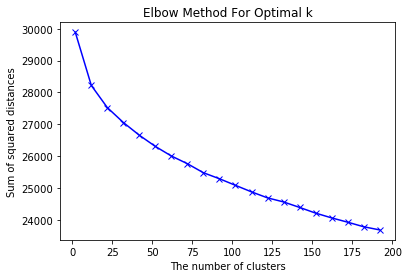

In [18]:
plt.plot(ks, distances, 'bx-')
plt.xlabel('The number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

### 2. Try k = num_genres

In [19]:
kmeans = KMeans(n_clusters=num_genres, random_state=seed)
kmeans = kmeans.fit(X)

In [20]:
kmeans.labels_.shape

(31283,)

In [21]:
kmeans.labels_

array([ 0, 17,  7, ...,  0, 14,  0], dtype=int32)

### 3. Find most common genre in each cluster

In [22]:
df = pd.concat([df, pd.DataFrame(kmeans.labels_)], axis=1)
columns = df.columns.to_list()
columns[-1] = 'cluster'
df.columns = columns

In [23]:
df.head()

,id,genres,keywords,cluster
0,862,"[Animation, Comedy, Family]","[jealousy, toy, boy, friendship, friends, riva...",0
1,8844,"[Adventure, Fantasy, Family]","[board game, disappearance, based on children'...",17
2,15602,"[Romance, Comedy]","[fishing, best friend, duringcreditsstinger, o...",7
3,31357,"[Comedy, Drama, Romance]","[based on novel, interracial relationship, sin...",5
4,11862,[Comedy],"[baby, midlife crisis, confidence, aging, daug...",13


In [24]:
most_common_genres = []
for k in range(0, num_genres):
    genres_list = df[df.cluster == k].genres.to_list()
    genres = [g for genres in genres_list for g in genres]
    most_common_genre = mode(genres)
    most_common_genres.append(most_common_genre)

In [25]:
most_common_genres

['Drama',
 'Music',
 'Drama',
 'Drama',
 'Crime',
 'Drama',
 'Drama',
 'Comedy',
 'Drama',
 'Thriller',
 'Drama',
 'Drama',
 'Drama',
 'Drama',
 'Drama',
 'Drama',
 'Drama',
 'Drama',
 'Comedy',
 'Comedy']

# 5. Visualization

### 1. Create a scatter plot in a 2D space consisting of the first two principle components

In [26]:
svd = TruncatedSVD(n_components=2, random_state=seed)
svd.fit(X)

TruncatedSVD(algorithm='randomized', n_components=2, n_iter=5, random_state=42,
             tol=0.0)

In [27]:
svd.explained_variance_ratio_

array([0.04055117, 0.02195666])

In [28]:
X_pca = svd.transform(X)

In [29]:
X_pca

array([[0.00258812, 0.0044618 ],
       [0.00358528, 0.00613359],
       [0.00294513, 0.00422809],
       ...,
       [0.00109853, 0.00473279],
       [0.00353458, 0.00584774],
       [0.0013492 , 0.00231497]])

In [32]:
X_pca.shape

(31283, 2)

In [33]:
fig = px.scatter(
    X_pca, x=0, y=1,
    color=kmeans.labels_,
    labels={
        '0': 'Principle Component 1',
        '1': 'Principle Component 2',
    },
)
fig.show()

### 2. Generate word clouds

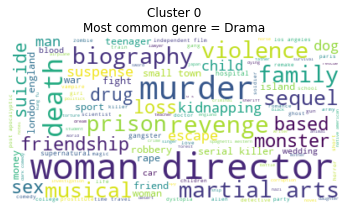

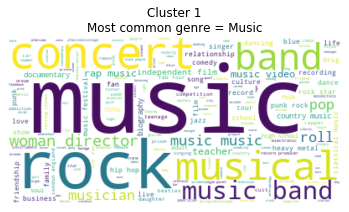

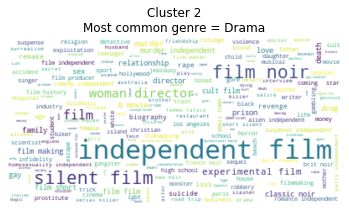

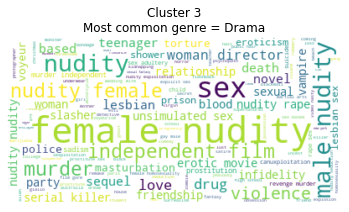

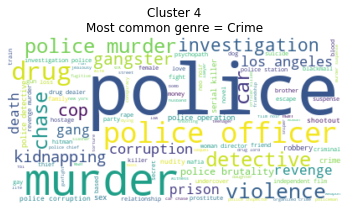

...

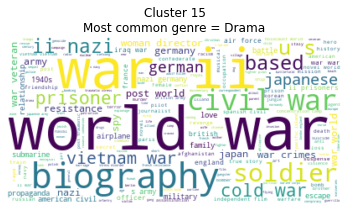

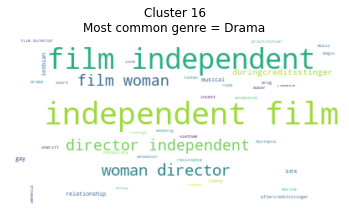

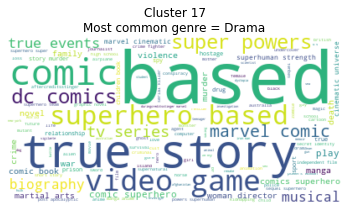

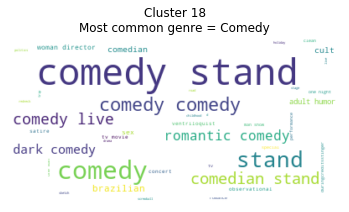

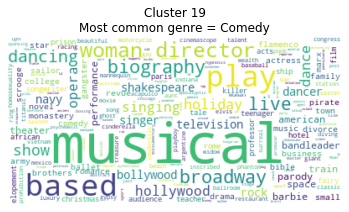

In [34]:
wordcloud = WordCloud(background_color='white')
for k in range(0, num_genres):
    keywords = df[df.cluster == k].keywords.to_list()
    keywords = [' '.join(w) for w in keywords]
    keywords = ' '.join(keywords)

    cloud = wordcloud.generate(keywords)
    plt.imshow(cloud, interpolation='bilinear')
    plt.title(f'Cluster {k}\nMost common genre = {most_common_genres[k]}')
    plt.axis("off")
    plt.show()

# Hidden

In [35]:
distances = []
ks = range(10, 1000, 50)
for k in ks:
    print(f'k = {k} start')
    kmeans = KMeans(n_clusters=k, random_state=seed)
    kmeans = kmeans.fit(X)
    print(f'k = {k} end: distance = {kmeans.inertia_}')
    distances.append(kmeans.inertia_)

k = 10 start
k = 10 end: distance = 28373.555785436896
k = 60 start
k = 60 end: distance = 26007.698852031575
k = 110 start
k = 110 end: distance = 24926.726066920113
k = 160 start
k = 160 end: distance = 24084.972293957755
k = 210 start
k = 210 end: distance = 23519.39625023975
k = 260 start
k = 260 end: distance = 22985.427463817367
k = 310 start
k = 310 end: distance = 22560.678447825976
k = 360 start
k = 360 end: distance = 22169.284817642958
k = 410 start
k = 410 end: distance = 21776.061426616747
k = 460 start
k = 460 end: distance = 21499.279476578005
k = 510 start
k = 510 end: distance = 21217.987608508025
k = 560 start
k = 560 end: distance = 20971.750451639346
k = 610 start
k = 610 end: distance = 20741.44157609023
k = 660 start
k = 660 end: distance = 20531.932542709023
k = 710 start
k = 710 end: distance = 20345.06705547501
k = 760 start
k = 760 end: distance = 20156.229176562207
k = 810 start
k = 810 end: distance = 19973.196527848242
k = 860 start
k = 860 end: distance = 

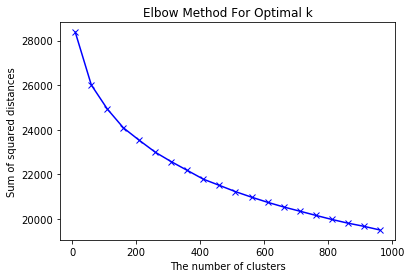

In [36]:
plt.plot(ks, distances, 'bx-')
plt.xlabel('The number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()

# References

* https://towardsdatascience.com/clustering-documents-with-python-97314ad6a78d
* https://pythonprogramminglanguage.com/kmeans-text-clustering/
* https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html
* https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html
* https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html#sklearn.decomposition.TruncatedSVD
* https://plotly.com/python/pca-visualization/#2d-pca-scatter-plot